In [29]:
import requests
import pandas as pd
import json
import geopandas as gpd
pd.set_option('display.max_columns', None)

In [30]:
# pull the commuting data from the American Communities Surveys US Census
# Pulling 2021 and 2020

acs5_2021 = requests.get("https://api.census.gov/data/2021/acs/acs5?get=NAME,group(B08301)&for=tract:*&in=state:48&in=county:021,055,209,453,491")
acs5_commmuting_data_2021 = pd.read_json(json.dumps(acs5_2021.json()))

acs5_commmuting_data_2021.columns = acs5_commmuting_data_2021.iloc[0]
acs5_commmuting_data_2021.drop(index=acs5_commmuting_data_2021.index[0], axis=0, inplace=True)
acs5_commmuting_data_2021 = acs5_commmuting_data_2021.reset_index()
acs5_commmuting_data_2021 = acs5_commmuting_data_2021.drop(columns="index")


acs5_2020 = requests.get("https://api.census.gov/data/2020/acs/acs5?get=NAME,group(B08301)&for=tract:*&in=state:48&in=county:021,055,209,453,491")
acs5_commmuting_data_2020 = pd.read_json(json.dumps(acs5_2020.json()))

acs5_commmuting_data_2020.columns = acs5_commmuting_data_2020.iloc[0]
acs5_commmuting_data_2020.drop(index=acs5_commmuting_data_2020.index[0], axis=0, inplace=True)
acs5_commmuting_data_2020 = acs5_commmuting_data_2020.reset_index()
acs5_commmuting_data_2020 = acs5_commmuting_data_2020.drop(columns="index")

# convert strings from API to integers for analysis
convert_these_columns_to_int_type = ['B08301_001E', 'B08301_002E', 'B08301_003E', 'B08301_004E', 'B08301_005E', 'B08301_006E', 'B08301_007E', 'B08301_008E', 'B08301_009E', 'B08301_010E', 'B08301_011E', 'B08301_012E', 'B08301_013E', 'B08301_014E', 'B08301_015E', 'B08301_016E', 'B08301_017E', 'B08301_018E', 'B08301_019E', 'B08301_020E', 'B08301_021E']
for col_name in convert_these_columns_to_int_type:
    acs5_commmuting_data_2021[col_name] = pd.to_numeric(acs5_commmuting_data_2021[col_name])
    acs5_commmuting_data_2020[col_name] = pd.to_numeric(acs5_commmuting_data_2020[col_name])

    

# acs5_2019 = requests.get("https://api.census.gov/data/2019/acs/acs5?get=NAME,group(B08301)&for=tract:*&in=state:48&in=county:021,055,209,453,491")
# acs5_commmuting_data_2019 = pd.read_json(json.dumps(acs5_2019.json()))
# acs1_2021 = requests.get("https://api.census.gov/data/2021/acs/acs1?get=NAME,group(B08301)&for=tract:*&in=state:48&in=county:021,055,209,453,491")
# acs1_commmuting_data_2021 = pd.read_json(json.dumps(acs5_2021.json()))

# acs1_commmuting_data_2021.columns = acs1_commmuting_data_2021.iloc[0]
# acs1_commmuting_data_2021.drop(index=acs1_commmuting_data_2021.index[0], axis=0, inplace=True)
# acs1_commmuting_data_2021 = acs1_commmuting_data_2021.reset_index()
# acs1_commmuting_data_2021 = acs1_commmuting_data_2021.drop(columns="index")

# acs1_2020 = requests.get("https://api.census.gov/data/2020/acs/acs1?get=NAME,group(B08301)&for=tract:*&in=state:48&in=county:021,055,209,453,491")
# acs1_commmuting_data_2020 = pd.read_json(json.dumps(acs5_2020.json()))

# acs1_commmuting_data_2020.columns = acs1_commmuting_data_2020.iloc[0]
# acs1_commmuting_data_2020.drop(index=acs1_commmuting_data_2020.index[0], axis=0, inplace=True)
# acs1_commmuting_data_2020 = acs1_commmuting_data_2020.reset_index()
# acs1_commmuting_data_2020 = acs1_commmuting_data_2020.drop(columns="index")

# acs1_2019 = requests.get("https://api.census.gov/data/2019/acs/acs1?get=NAME,group(B08301)&for=tract:*&in=state:48&in=county:021,055,209,453,491")
# acs1_commmuting_data_2019 = pd.read_json(json.dumps(acs5_2019.json()))

In [31]:
# import Austin area census tracts
texas_census_tracts = gpd.read_file("https://www2.census.gov/geo/tiger/TIGER2022/TRACT/tl_2022_48_tract.zip")
austin_metro_census_tracts = texas_census_tracts[texas_census_tracts['COUNTYFP'].isin(["021", "055", "209", "453", "491"])]

In [32]:
# import column names
column_name_page = pd.read_html("https://api.census.gov/data/2021/acs/acs5/groups/B08301.html")
column_names_table = column_name_page[0]
column_names_table.drop(column_names_table.tail(1).index,inplace=True)

In [33]:
# atxMetroTracts1 = cd.censusgeo([('state',"48"),('county', '453'),('tract','*')]) # Travis County
# atxMetroTracts2 = cd.censusgeo([('state',"48"),('county', '491'),('tract','*')]) # Williamson County
# atxMetroTracts3 = cd.censusgeo([('state',"48"),('county', '021'),('tract','*')]) # Bastrop County
# atxMetroTracts4 = cd.censusgeo([('state',"48"),('county', '055'),('tract','*')]) # Caldwell County
# atxMetroTracts5 = cd.censusgeo([('state',"48"),('county', '209'),('tract','*')]) # Hays County

<AxesSubplot:>

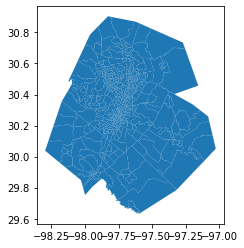

In [34]:
# show all tracts in the austin metro area
austin_metro_census_tracts.plot()

In [35]:
# render out the census codes and their corresponding meanings as a reference sheet
for x in column_names_table.index:
    if column_names_table['Name'][x][-1:] == "E":
        print(column_names_table['Name'][x])
        print(column_names_table['Label'][x])

B08301_001E
Estimate!!Total:
B08301_002E
Estimate!!Total:!!Car, truck, or van:
B08301_003E
Estimate!!Total:!!Car, truck, or van:!!Drove alone
B08301_004E
Estimate!!Total:!!Car, truck, or van:!!Carpooled:
B08301_005E
Estimate!!Total:!!Car, truck, or van:!!Carpooled:!!In 2-person carpool
B08301_006E
Estimate!!Total:!!Car, truck, or van:!!Carpooled:!!In 3-person carpool
B08301_007E
Estimate!!Total:!!Car, truck, or van:!!Carpooled:!!In 4-person carpool
B08301_008E
Estimate!!Total:!!Car, truck, or van:!!Carpooled:!!In 5- or 6-person carpool
B08301_009E
Estimate!!Total:!!Car, truck, or van:!!Carpooled:!!In 7-or-more-person carpool
B08301_010E
Estimate!!Total:!!Public transportation (excluding taxicab):
B08301_011E
Estimate!!Total:!!Public transportation (excluding taxicab):!!Bus
B08301_012E
Estimate!!Total:!!Public transportation (excluding taxicab):!!Subway or elevated rail
B08301_013E
Estimate!!Total:!!Public transportation (excluding taxicab):!!Long-distance train or commuter rail
B08301_

In [36]:
# initialize a bunch of null columns in the table containing the census tracts
# then iterate through all the census tracts, and crunch the numbers for each one
# I tried to make all the variable names as descriptive as possible here
austin_metro_census_tracts['sq_mi'] = None
austin_metro_census_tracts['total_commuters_2021'] = None
austin_metro_census_tracts['total_commuters_per_sq_mile_2021'] = None
austin_metro_census_tracts['total_commuters_2020'] = None
austin_metro_census_tracts['change_in_total_commuters'] = None
austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'] = None
austin_metro_census_tracts['drove_2021'] = None
austin_metro_census_tracts['drivers_per_sq_mile_2021'] = None
austin_metro_census_tracts['drove_2020'] = None
austin_metro_census_tracts['percent_drove_2021'] = None
austin_metro_census_tracts['percent_drove_2020'] = None
austin_metro_census_tracts['change_in_percent_drove'] = None
austin_metro_census_tracts['drove_alone_2021'] = None
austin_metro_census_tracts['drove_alone_per_sq_mile_2021'] = None
austin_metro_census_tracts['drove_alone_2020'] = None
austin_metro_census_tracts['percent_drove_alone_2021'] = None
austin_metro_census_tracts['percent_drove_alone_2020'] = None
austin_metro_census_tracts['change_in_percent_drove_alone'] = None
austin_metro_census_tracts['carpool_2021'] = None
austin_metro_census_tracts['carpool_per_sq_mile_2021'] = None
austin_metro_census_tracts['carpool_2020'] = None
austin_metro_census_tracts['percent_carpool_2021'] = None
austin_metro_census_tracts['percent_carpool_2020'] = None
austin_metro_census_tracts['change_in_percent_carpool'] = None
austin_metro_census_tracts['transit_2021'] = None
austin_metro_census_tracts['transit_per_sq_mile_2021'] = None
austin_metro_census_tracts['transit_2020'] = None
austin_metro_census_tracts['percent_transit_2021'] = None
austin_metro_census_tracts['percent_transit_2020'] = None
austin_metro_census_tracts['change_in_percent_transit'] = None
austin_metro_census_tracts['bus_2021'] = None
austin_metro_census_tracts['bus_2020'] = None
austin_metro_census_tracts['percent_bus_2021'] = None
austin_metro_census_tracts['percent_bus_2020'] = None
austin_metro_census_tracts['change_in_percent_bus'] = None
austin_metro_census_tracts['trains_2021'] = None
austin_metro_census_tracts['trains_2020'] = None
austin_metro_census_tracts['percent_trains_2021'] = None
austin_metro_census_tracts['percent_trains_2020'] = None
austin_metro_census_tracts['change_in_percent_trains'] = None
austin_metro_census_tracts['walked_2021'] = None
austin_metro_census_tracts['walked_per_sq_mile_2021'] = None
austin_metro_census_tracts['walked_2020'] = None
austin_metro_census_tracts['percent_walked_2021'] = None
austin_metro_census_tracts['percent_walked_2020'] = None
austin_metro_census_tracts['change_in_percent_walked'] = None
austin_metro_census_tracts['biked_2021'] = None
austin_metro_census_tracts['biked_per_sq_mile_2021'] = None
austin_metro_census_tracts['biked_2020'] = None
austin_metro_census_tracts['percent_biked_2021'] = None
austin_metro_census_tracts['percent_biked_2020'] = None
austin_metro_census_tracts['change_in_percent_biked'] = None
austin_metro_census_tracts['wfh_2021'] = None
austin_metro_census_tracts['wfh_per_sq_mile_2021'] = None
austin_metro_census_tracts['wfh_2020'] = None
austin_metro_census_tracts['percent_wfh_2021'] = None
austin_metro_census_tracts['percent_wfh_2020'] = None
austin_metro_census_tracts['change_in_percent_wfh'] = None
austin_metro_census_tracts['active_transportation_2021'] = None
austin_metro_census_tracts['active_transportation_per_sq_mile_2021'] = None
austin_metro_census_tracts['active_transportation_2020'] = None
austin_metro_census_tracts['percent_active_transportation_2021'] = None
austin_metro_census_tracts['percent_active_transportation_2020'] = None
austin_metro_census_tracts['change_in_active_transportation'] = None
# in this instance other is taxi motorcycle and "other"
austin_metro_census_tracts['other_2021'] = None
austin_metro_census_tracts['other_2020'] = None
austin_metro_census_tracts['percent_other_2021'] = None
austin_metro_census_tracts['percent_other_2020'] = None
austin_metro_census_tracts['change_in_percent_other'] = None

for x in austin_metro_census_tracts.index:

    print(austin_metro_census_tracts['TRACTCE'][x])
    data_2021_acs5 = acs5_commmuting_data_2021[acs5_commmuting_data_2021['tract']==austin_metro_census_tracts['TRACTCE'][x]].reset_index()
#     data_2021_acs1 = acs1_commmuting_data_2021[acs1_commmuting_data_2021['tract']==austin_metro_census_tracts['TRACTCE'][x]].reset_index()
    data_2020_acs5 = acs5_commmuting_data_2020[acs5_commmuting_data_2020['tract']==austin_metro_census_tracts['TRACTCE'][x]].reset_index()
#     data_2020_acs1 = acs1_commmuting_data_2020[acs1_commmuting_data_2020['tract']==austin_metro_census_tracts['TRACTCE'][x]].reset_index()
    total_commuters_2021 = int(data_2021_acs5['B08301_001E'][0])
    total_commuters_2020 = int(data_2020_acs5['B08301_001E'][0])
    if total_commuters_2021 == 0 or total_commuters_2020 == 0:
        continue
    austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
    austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
    austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
    austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
    austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
    austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
    austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
    austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
    austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
    austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
    austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
    austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
    austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
    austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
    austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
    austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
    austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
    austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
    austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
    austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
    austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
    austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
    austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
    austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
    austin_metro_census_tracts['walked_2021'][x] = data_2021_acs5['B08301_019E'][0]
    austin_metro_census_tracts['walked_per_sq_mile_2021'][x] = austin_metro_census_tracts['walked_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['walked_2020'][x] = data_2020_acs5['B08301_019E'][0]
    austin_metro_census_tracts['percent_walked_2021'][x] = data_2021_acs5['B08301_019E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_walked_2020'][x] = data_2020_acs5['B08301_019E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_walked'][x] = austin_metro_census_tracts['percent_walked_2021'][x] - austin_metro_census_tracts['percent_walked_2020'][x]
    austin_metro_census_tracts['biked_2021'][x] = data_2021_acs5['B08301_018E'][0]
    austin_metro_census_tracts['biked_per_sq_mile_2021'][x] = austin_metro_census_tracts['biked_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['biked_2020'][x] = data_2020_acs5['B08301_018E'][0]
    austin_metro_census_tracts['percent_biked_2021'][x] = data_2021_acs5['B08301_018E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_biked_2020'][x] = data_2020_acs5['B08301_018E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_biked'][x] = austin_metro_census_tracts['percent_biked_2021'][x] - austin_metro_census_tracts['percent_biked_2020'][x]
    austin_metro_census_tracts['wfh_2021'][x] = data_2021_acs5['B08301_021E'][0]
    austin_metro_census_tracts['wfh_per_sq_mile_2021'][x] = austin_metro_census_tracts['wfh_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['wfh_2020'][x] = data_2020_acs5['B08301_021E'][0]
    austin_metro_census_tracts['percent_wfh_2021'][x] = data_2021_acs5['B08301_021E'][0] / total_commuters_2021
    austin_metro_census_tracts['percent_wfh_2020'][x] = data_2020_acs5['B08301_021E'][0] / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_wfh'][x] = austin_metro_census_tracts['percent_wfh_2021'][x] - austin_metro_census_tracts['percent_wfh_2020'][x]
    austin_metro_census_tracts['active_transportation_2021'][x] = (data_2021_acs5['B08301_018E'][0] + data_2021_acs5['B08301_019E'][0] + data_2021_acs5['B08301_010E'][0])
    austin_metro_census_tracts['active_transportation_per_sq_mile_2021'][x] = austin_metro_census_tracts['active_transportation_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
    austin_metro_census_tracts['active_transportation_2020'][x] = (data_2020_acs5['B08301_018E'][0] + data_2020_acs5['B08301_019E'][0] + data_2020_acs5['B08301_010E'][0])
    austin_metro_census_tracts['percent_active_transportation_2021'][x] = (data_2021_acs5['B08301_018E'][0] + data_2021_acs5['B08301_019E'][0] + data_2021_acs5['B08301_010E'][0]) / total_commuters_2021
    austin_metro_census_tracts['percent_active_transportation_2020'][x] = (data_2020_acs5['B08301_018E'][0] + data_2020_acs5['B08301_019E'][0] + data_2020_acs5['B08301_010E'][0]) / total_commuters_2020
    austin_metro_census_tracts['change_in_active_transportation'][x] = austin_metro_census_tracts['percent_active_transportation_2021'][x] - austin_metro_census_tracts['percent_active_transportation_2020'][x]
    # in this instance other is taxi motorcycle and "other"
    austin_metro_census_tracts['other_2021'][x] = (data_2021_acs5['B08301_016E'][0] + data_2021_acs5['B08301_017E'][0] + data_2021_acs5['B08301_020E'][0])
    austin_metro_census_tracts['other_2020'][x] = (data_2020_acs5['B08301_016E'][0] + data_2020_acs5['B08301_017E'][0] + data_2020_acs5['B08301_020E'][0])
    austin_metro_census_tracts['percent_other_2021'][x] = (data_2021_acs5['B08301_016E'][0] + data_2021_acs5['B08301_017E'][0] + data_2021_acs5['B08301_020E'][0]) / total_commuters_2021
    austin_metro_census_tracts['percent_other_2020'][x] = (data_2020_acs5['B08301_016E'][0] + data_2020_acs5['B08301_017E'][0] + data_2020_acs5['B08301_020E'][0]) / total_commuters_2020
    austin_metro_census_tracts['change_in_percent_other'][x] = austin_metro_census_tracts['percent_other_2021'][x] - austin_metro_census_tracts['percent_other_2020'][x]

/home/ben/miniconda3/envs/bus/lib/python3.10/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/ben/miniconda3/envs/bus/lib/python3.10/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/ben/miniconda3/envs/bus/lib/python3.10/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

002447


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

040700


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

041900


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

041100


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

036700


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

044000


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

043700


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

036800


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

041500


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

002213


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

032400


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

041000


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

001312


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

044400


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

047000


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

044900


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

002453


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

041600


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

035200


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

040000


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

036400


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

034500


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

032100


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

033800


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

030100


/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
/tmp/ipykernel_147222/2227833497.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

030800


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

035300


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

031600


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

032500


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

045600


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

043000


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

034200


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

041300


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

042000


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

045100


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

041400


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

046000


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

043100


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

042500


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

046400


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

040200


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

033900


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

045200


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

035400


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

042200


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

030000


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

043800


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

030500


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

032800


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

046200


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

002449


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

042800


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

001311


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

046300


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

031300


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

035800


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

042300


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

045700


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

045500


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

042900


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

031900


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

044600


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002445


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

046500


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

044100


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

046800


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

042700


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002439


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

042100


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

044500


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

043900


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

033500


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

002440


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

042600


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

046100


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

002446


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

002442


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020349


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

045900


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

035600


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

035500


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

002219


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020119


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

020122


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

020514


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

020511


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

020342


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

020336


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

020517


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

021509


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

020608


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

021512


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

020607


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

021518


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

020346


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

021511


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

020337


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

020812


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

020814


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

021517


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020354


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

020711


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

020710


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

020512


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020712


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020713


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

020333


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

020606


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

020819


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020352


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

034000


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

001923


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

033000


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

036900


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

001309


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

036600


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

037400


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

030700


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

030200


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

032200


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

032300


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

031800


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

032000


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

043500


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

042400


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

040300


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

043600


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

002322


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

031700


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

031000


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

002323


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

037300


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

037000


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

030600


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

002438


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

000608


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

000606


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

000607


/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
/tmp/ipykernel_147222/2227833497.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

001101


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

001310


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

001102


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

033100


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

033300


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

030900


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

037500


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002218


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

045000


/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
/tmp/ipykernel_147222/2227833497.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

002221


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

046600


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

002006


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

000605


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

002007


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

037600


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

034800


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

036000


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

031500


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

034900


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

031200


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

045400


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

045300


/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
/tmp/ipykernel_147222/2227833497.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

040400


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

001920


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

021515


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

020207


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

020206


/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
/tmp/ipykernel_147222/2227833497.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

020121


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

020516


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

020820


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

021407


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

021405


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

020811


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

020813


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

021406


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

020123


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

020821


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

002324


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

041200


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

045800


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

002217


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

044700


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

002450


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

044800


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

036500


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

002220


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

010807


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

010806


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

010809


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

010702


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

010905


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

010909


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

020350


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020505


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

020353


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

020355


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

020340


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

020319


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020822


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

020344


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

020816


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

021514


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

020345


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020348


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

020709


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

021513


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

020513


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

020118


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

020205


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

020116


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

020330


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

020338


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

020347


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

020208


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

960702


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

960501


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

960104


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

960502


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

960701


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

960103


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

010813


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

010811


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

010918


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

010920


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

010913


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

010912


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

010917


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

010812


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

010818


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

010817


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020609


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

020117


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

020817


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

020818


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

020334


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

020810


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

020515


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

021404


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

020343


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

020356


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

021510


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

020335


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

020341


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

020124


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020329


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020815


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

021516


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

020331


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

020332


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020339


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

020120


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

020351


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

010814


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

010914


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

010402


/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
/tmp/ipykernel_147222/2227833497.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

010602


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

010306


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

010309


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

010916


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

010810


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

010921


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

010603


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

010704


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

010601


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

010925


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

010307


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

010703


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

010305


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

010308


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

010919


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

010924


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

010911


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

010922


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

010923


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

002451


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

010816


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

010401


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

010915


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

010815


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

040500


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

031100


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

031400


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

035700


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

040800


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

040100


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

041800


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

041700


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

002443


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

034700


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

037200


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

002444


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

033600


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

040900


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

040600


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

033400


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

001922


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

001103


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

035100


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

030300


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

030400


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

034300


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

034400


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

033700


/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_trains'][x] = austin_metro_census_tracts['percent_trains_2021'][x] - austin_metro_census_tracts['percent_trains_2020'][x]
/tmp/ipykernel_147222/2227833497.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

032700


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

032900


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

037100


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

036300


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

044300


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

001921


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

032600


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

043400


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002437


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

002441


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

035000


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

002216


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

002448


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

044200


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

000309


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

036200


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

002214


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

002320


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

002327


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

002325


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

043200


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

033200


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

035900


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

043300


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

036100


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

034100


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

002452


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

046700


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

002222


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

000308


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

034600


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

002321


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002215


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

046900


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

002326


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

000402


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

000500


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

000601


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

000801


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

000802


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

000803


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

000804


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

000901


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

001603


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

001605


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

001606


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

002307


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002003


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

000101


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

002313


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

000700


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

001604


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

001910


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

002407


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

002315


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

001308


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

001911


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002110


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

002111


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

002105


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

002106


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

002107


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

002109


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

000204


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

001403


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

002108


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

001913


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

000902


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

001000


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

001200


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

001304


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

001307


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

001401


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

000102


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

002104


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

000203


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

000302


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

000401


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

001503


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

001402


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

001504


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

001505


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

001501


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

001602


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002002


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

002004


/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

001912


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

021506


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

020111


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020327


/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

020323


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

020410


/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

960400


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

960300


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

960600


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

960200


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

020403


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

020404


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

960102


/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

020405


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

020406


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

020503


/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

020602


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

010500


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

010200


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020411


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

020108


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

020106


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

020604


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

020508


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

020409


/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

020201


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

020706


/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentatio

020509


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

001916


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

001918


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

001914


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

002430


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

000304


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

002319


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

001917


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

000206


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

000305


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

000205


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

000307


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

001919


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

021601


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

020114


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

020115


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

021603


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

020109


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

020325


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

020321


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

020326


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

020311


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

020507


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

020408


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

020707


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

001915


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

020203


/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

021602


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

020808


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

002434


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

950700


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

002211


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002500


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

002436


/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2020'][x] = austin_metro_census_tracts['transit_2020'][x] - austin_metro_census_tracts['bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https:/

002432


/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters_per_sq_mile'][x] = austin_metro_census_tracts['change_in_total_commuters'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in 

020113


/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

010100


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

010302


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

020704


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

021100


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

021201


/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in th

021202


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

021203


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

020701


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

021402


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

021503


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

002112


/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/i

002113


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

002201


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

980000
002304


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

002314


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

002316


/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

002403


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

002409


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

002410


/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

002411


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

002412


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

002413


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

002419


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

002422


/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2020'][x] = data_2020_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

002423


/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

002424


/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2021'][x] = data_2021_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pan

002310


/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2021'][x] = data_2021_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_trac

020310


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

020900


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

021300


/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove'][x] = (data_2021_acs5['B08301_002E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_002E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.

021502


/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_per_sq_mile_2021'][x] = austin_metro_census_tracts['carpool_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

021000


/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2021'][x] = data_2021_acs5['B08301_010E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

950503


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

950102


/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_per_sq_mile_2021'][x] = total_commuters_2021 / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

950101


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

950202


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

950403


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

950301


/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2020'][x] = data_2020_acs5['B08301_011E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

950402


/tmp/ipykernel_147222/2227833497.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2020'][x] = total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_total_commuters'][x] = (total_commuters_2021 - total_commuters_2020) / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

950201


/tmp/ipykernel_147222/2227833497.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_per_sq_mile_2021'][x] = austin_metro_census_tracts['drove_alone_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable

950302


/tmp/ipykernel_147222/2227833497.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2020'][x] = data_2020_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2021'][x] = data_2021_acs5['B08301_004E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

950401


/tmp/ipykernel_147222/2227833497.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_transit_2020'][x] = data_2020_acs5['B08301_010E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_transit'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_transit_2020'][x]
/tmp/ipykernel_147222/2227833497.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

950303


/tmp/ipykernel_147222/2227833497.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2021'][x] = austin_metro_census_tracts['percent_transit_2021'][x] - austin_metro_census_tracts['percent_bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_trains_2020'][x] = austin_metro_census_tracts['percent_transit_2020'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

950505


/tmp/ipykernel_147222/2227833497.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_2021'][x] = data_2021_acs5['B08301_002E'][0]
/tmp/ipykernel_147222/2227833497.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drivers_per_sq_mile_2021'][x] = data_2021_acs5['B08301_002E'][0] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

950504


/tmp/ipykernel_147222/2227833497.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['drove_alone_2020'][x] = data_2020_acs5['B08301_003E'][0]
/tmp/ipykernel_147222/2227833497.py:98: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_alone_2021'][x] = data_2021_acs5['B08301_003E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:99: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

950601


/tmp/ipykernel_147222/2227833497.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_carpool_2020'][x] = data_2020_acs5['B08301_004E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_carpool'][x] = austin_metro_census_tracts['percent_carpool_2021'][x] - austin_metro_census_tracts['percent_carpool_2020'][x]
/tmp/ipykernel_147222/2227833497.py:107: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation

950806


/tmp/ipykernel_147222/2227833497.py:114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['bus_2020'][x] = data_2020_acs5['B08301_011E'][0]
/tmp/ipykernel_147222/2227833497.py:115: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_bus_2021'][x] = data_2021_acs5['B08301_011E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

950805


/tmp/ipykernel_147222/2227833497.py:83: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['sq_mi'][x] = (0.386102 * austin_metro_census_tracts['geometry'][x].area) / (1000 * 1000)
/tmp/ipykernel_147222/2227833497.py:84: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['total_commuters_2021'][x] = total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

950602


/tmp/ipykernel_147222/2227833497.py:92: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2021'][x] = data_2021_acs5['B08301_002E'][0] / total_commuters_2021
/tmp/ipykernel_147222/2227833497.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['percent_drove_2020'][x] = data_2020_acs5['B08301_002E'][0] / total_commuters_2020
/tmp/ipykernel_147222/2227833497.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

950506


/tmp/ipykernel_147222/2227833497.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_drove_alone'][x] = (data_2021_acs5['B08301_003E'][0] / total_commuters_2021) - (data_2020_acs5['B08301_003E'][0] / total_commuters_2020)
/tmp/ipykernel_147222/2227833497.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['carpool_2021'][x] = data_2021_acs5['B08301_004E'][0]
/tmp/ipykernel_147222/2227833497.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.py

950804


/tmp/ipykernel_147222/2227833497.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_per_sq_mile_2021'][x] = austin_metro_census_tracts['transit_2021'][x] / austin_metro_census_tracts['sq_mi'][x]
/tmp/ipykernel_147222/2227833497.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['transit_2020'][x] = data_2020_acs5['B08301_010E'][0]
/tmp/ipykernel_147222/2227833497.py:110: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

950803


/tmp/ipykernel_147222/2227833497.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['change_in_percent_bus'][x] = austin_metro_census_tracts['percent_bus_2021'][x] - austin_metro_census_tracts['percent_bus_2020'][x]
/tmp/ipykernel_147222/2227833497.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  austin_metro_census_tracts['trains_2021'][x] = austin_metro_census_tracts['transit_2021'][x] - austin_metro_census_tracts['bus_2021'][x]
/tmp/ipykernel_147222/2227833497.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the 

In [37]:
austin_metro_census_tracts

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,sq_mi,total_commuters_2021,total_commuters_per_sq_mile_2021,total_commuters_2020,change_in_total_commuters,change_in_total_commuters_per_sq_mile,drove_2021,drivers_per_sq_mile_2021,drove_2020,percent_drove_2021,percent_drove_2020,change_in_percent_drove,drove_alone_2021,drove_alone_per_sq_mile_2021,drove_alone_2020,percent_drove_alone_2021,percent_drove_alone_2020,change_in_percent_drove_alone,carpool_2021,carpool_per_sq_mile_2021,carpool_2020,percent_carpool_2021,percent_carpool_2020,change_in_percent_carpool,transit_2021,transit_per_sq_mile_2021,transit_2020,percent_transit_2021,percent_transit_2020,change_in_percent_transit,bus_2021,bus_2020,percent_bus_2021,percent_bus_2020,change_in_percent_bus,trains_2021,trains_2020,percent_trains_2021,percent_trains_2020,change_in_percent_trains,walked_2021,walked_per_sq_mile_2021,walked_2020,percent_walked_2021,percent_walked_2020,change_in_percent_walked,biked_2021,biked_per_sq_mile_2021,biked_2020,percent_biked_2021,percent_biked_2020,change_in_percent_biked,wfh_2021,wfh_per_sq_mile_2021,wfh_2020,percent_wfh_2021,percent_wfh_2020,change_in_percent_wfh,active_transportation_2021,active_transportation_per_sq_mile_2021,active_transportation_2020,percent_active_transportation_2021,percent_active_transportation_2020,change_in_active_transportation,other_2021,other_2020,percent_other_2021,percent_other_2020,change_in_percent_other
70,48,453,002447,48453002447,24.47,Census Tract 24.47,G5020,S,4040858,0,+30.2048955,-097.7279383,"POLYGON ((-97.74044 30.20685, -97.73690 30.212...",0.0,1830,12520004865636.175781,1740,0.051724,353872381.730813,1613,11035392266814.835938,1584,0.881421,0.910345,-0.028924,1194,8168790059874.094727,1150,0.652459,0.66092,-0.008461,419,2866602206940.741699,434,0.228962,0.249425,-0.020464,18,123147588842.323029,19,0.009836,0.01092,-0.001083,18,19,0.009836,0.01092,-0.001083,0,0,0.0,0.0,0.0,0,0.0,0,0.0,0.0,0.0,0,0.0,0,0.0,0.0,0.0,199,1361465009979.015869,137,0.108743,0.078736,0.030008,18,123147588842.323029,19,0.009836,0.01092,-0.001083,0,0,0.0,0.0,0.0
91,48,453,040700,48453040700,407,Census Tract 407,G5020,S,1971513,0,+30.3718046,-097.7148275,"POLYGON ((-97.72387 30.37230, -97.72385 30.372...",0.0,3620,50677180612094.234375,3827,-0.054089,-757208983.762039,2921,40891725018764.4375,2925,0.806906,0.764306,0.0426,2470,34578076273998.0,2420,0.68232,0.632349,0.049971,451,6313648744766.436523,505,0.124586,0.131957,-0.007372,273,3821787377652.410645,258,0.075414,0.067416,0.007999,273,258,0.075414,0.067416,0.007999,0,0,0.0,0.0,0.0,11,153991432799.181396,39,0.003039,0.010191,-0.007152,0,0.0,71,0.0,0.018552,-0.018552,415,5809676782878.207031,480,0.114641,0.125425,-0.010784,284,3975778810451.591797,368,0.078453,0.096159,-0.017706,0,54,0.0,0.01411,-0.01411
92,48,453,041900,48453041900,419,Census Tract 419,G5020,S,2656097,0,+30.3924913,-097.6904457,"POLYGON ((-97.70035 30.40317, -97.70025 30.403...",0.0,2258,23458090574484.675781,2153,0.048769,506656933.744969,1455,15115820100033.306641,1568,0.644376,0.728286,-0.083911,1345,13973043322711.201172,1435,0.59566,0.666512,-0.070852,110,1142776777322.105713,133,0.048716,0.061774,-0.013059,46,477888470516.516907,48,0.020372,0.022294,-0.001922,35,37,0.0155,0.017185,-0.001685,11,11,0.004872,0.005109,-0.000238,217,2254386915262.699219,222,0.096103,0.103112,-0.007009,56,581777268454.890137,58,0.024801,0.026939,-0.002138,390,4051663119596.556152,244,0.172719,0.11333,0.059389,319,3314052654234.106445,328,0.141275,0.152346,-0.01107,94,13,0.04163,0.006038,0.035592
93,48,453,041100,48453041100,411,Census Tract 411,G5020,S,1439764,0,+30.3851014,-097.6791969,"POLYGON ((-97.68633 30.38201, -97.68580 30.382...",0.0,1051,20144530923277.144531,1098,-0.042805,-820445922.25812,872,16713635551948.306641,873,0.829686,0.795082,0.034604,689,13206072127628.880859,734,0.655566,0.668488,-0.012922,183,3507563424319.426758,139,0.17412,0.126594,0.047526,39,747513516

In [38]:
config = {'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': 'pn5w00p',
     'type': 'point',
     'config': {'dataId': 'commuting_changes',
      'label': 'intpt',
      'color': [30, 150, 190],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'INTPTLAT', 'lng': 'INTPTLON', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'COUNTYFP', 'type': 'integer'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'cbhd648',
     'type': 'geojson',
     'config': {'dataId': 'commuting_changes',
      'label': 'commuting_changes',
      'color': [137, 218, 193],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'geojson': 'geometry'},
      'isVisible': True,
      'visConfig': {'opacity': 0.48,
       'strokeOpacity': 0.8,
       'thickness': 0,
       'strokeColor': [255, 254, 213],
       'colorRange': {'name': 'ColorBrewer RdYlGn-10',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#a50026',
         '#d73027',
         '#f46d43',
         '#fdae61',
         '#fee08b',
         '#d9ef8b',
         '#a6d96a',
         '#66bd63',
         '#1a9850',
         '#006837']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radius': 10,
       'sizeRange': [0, 10],
       'radiusRange': [0, 50],
       'heightRange': [0, 500],
       'elevationScale': 90.5,
       'enableElevationZoomFactor': True,
       'stroked': True,
       'filled': True,
       'enable3d': True,
       'wireframe': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'percent_active_transportation_2021',
       'type': 'real'},
      'colorScale': 'quantize',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear',
      'heightField': {'name': 'active_transportation_per_sq_mile_2021',
       'type': 'real'},
      'heightScale': 'linear',
      'radiusField': None,
      'radiusScale': 'linear'}}],
   'interactionConfig': {'tooltip': {'fieldsToShow': {'commuting_changes': [{'name': 'percent_active_transportation_2021',
        'format': '.1%'},
       {'name': 'total_commuters_2021', 'format': None},
       {'name': 'percent_walked_2021', 'format': '.1%'},
       {'name': 'percent_biked_2021', 'format': '.1%'},
       {'name': 'percent_transit_2021', 'format': '.1%'},
       {'name': 'active_transportation_2021', 'format': None},
       {'name': 'walked_2021', 'format': None},
       {'name': 'biked_2021', 'format': None},
       {'name': 'transit_2021', 'format': None},
       {'name': 'NAMELSAD', 'format': None}]},
     'compareMode': False,
     'compareType': 'absolute',
     'enabled': True},
    'brush': {'size': 0.5, 'enabled': False},
    'geocoder': {'enabled': False},
    'coordinate': {'enabled': False}},
   'layerBlending': 'normal',
   'splitMaps': [],
   'animationConfig': {'currentTime': None, 'speed': 1}},
  'mapState': {'bearing': 53.74661696297319,
   'dragRotate': True,
   'latitude': 30.498687105524784,
   'longitude': -97.62977131892085,
   'pitch': 49.87792821703171,
   'zoom': 9.509132989110885,
   'isSplit': False},
  'mapStyle': {'styleType': 'dark',
   'topLayerGroups': {},
   'visibleLayerGroups': {'label': True,
    'road': True,
    'border': False,
    'building': True,
    'water': True,
    'land': True,
    '3d building': False},
   'threeDBuildingColor': [9.665468314072013,
    17.18305478057247,
    31.1442867897876],
   'mapStyles': {}}}}
density_of_active_transportation_in_austin_metro_area = KeplerGl(height=800, data={"commuting_changes": austin_metro_census_tracts}, config=config)
density_of_active_transportation_in_austin_metro_area

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'commuting_changes':      STATEFP COUNTYFP TRACTCE        GEOID     NAME              NAMELSAD …

In [39]:
density_of_active_transportation_in_austin_metro_area.config

{'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': 'pn5w00p',
     'type': 'point',
     'config': {'dataId': 'commuting_changes',
      'label': 'intpt',
      'color': [30, 150, 190],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'INTPTLAT', 'lng': 'INTPTLON', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300'

In [47]:
density_of_active_transportation_in_austin_metro_area.save_to_html(file_name="density_of_active_transportation_in_austin_metro_area.html")

Map saved to density_of_active_transportation_in_austin_metro_area.html!


In [ ]:
config={'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': '4dvqhef',
     'type': 'point',
     'config': {'dataId': 'commuting_changes',
      'label': 'intpt',
      'color': [77, 193, 156],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'INTPTLAT', 'lng': 'INTPTLON', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'COUNTYFP', 'type': 'integer'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'fpiz2t',
     'type': 'geojson',
     'config': {'dataId': 'commuting_changes',
      'label': 'commuting_changes',
      'color': [119, 110, 87],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'geojson': 'geometry'},
      'isVisible': True,
      'visConfig': {'opacity': 0.53,
       'strokeOpacity': 0.8,
       'thickness': 0.5,
       'strokeColor': [255, 254, 230],
       'colorRange': {'name': 'ColorBrewer RdYlGn-10',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#006837',
         '#1a9850',
         '#66bd63',
         '#a6d96a',
         '#d9ef8b',
         '#fee08b',
         '#fdae61',
         '#f46d43',
         '#d73027',
         '#a50026'],
        'reversed': True},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radius': 10,
       'sizeRange': [0, 10],
       'radiusRange': [0, 50],
       'heightRange': [0, 500],
       'elevationScale': 76.1,
       'enableElevationZoomFactor': True,
       'stroked': True,
       'filled': True,
       'enable3d': True,
       'wireframe': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'percent_carpool_2021',
       'type': 'real'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear',
      'heightField': {'name': 'carpool_per_sq_mile_2021', 'type': 'real'},
      'heightScale': 'linear',
      'radiusField': None,
      'radiusScale': 'linear'}}],
   'interactionConfig': {'tooltip': {'fieldsToShow': {'commuting_changes': [{'name': 'NAMELSAD',
        'format': None},
       {'name': 'percent_carpool_2021', 'format': '.1%'},
       {'name': 'total_commuters_2021', 'format': None},
       {'name': 'carpool_2021', 'format': None}]},
     'compareMode': False,
     'compareType': 'absolute',
     'enabled': True},
    'brush': {'size': 0.5, 'enabled': False},
    'geocoder': {'enabled': False},
    'coordinate': {'enabled': False}},
   'layerBlending': 'normal',
   'splitMaps': [],
   'animationConfig': {'currentTime': None, 'speed': 1}},
  'mapState': {'bearing': 48.37298384445975,
   'dragRotate': True,
   'latitude': 30.17849211157047,
   'longitude': -97.79250279401666,
   'pitch': 42.70576156792309,
   'zoom': 9.174909723485644,
   'isSplit': False},
  'mapStyle': {'styleType': 'dark',
   'topLayerGroups': {},
   'visibleLayerGroups': {'label': True,
    'road': True,
    'border': False,
    'building': True,
    'water': True,
    'land': True,
    '3d building': False},
   'threeDBuildingColor': [9.665468314072013,
    17.18305478057247,
    31.1442867897876],
   'mapStyles': {}}}}

In [42]:
density_of_carpoolers = KeplerGl(height=800, data={"commuting_changes": austin_metro_census_tracts}, config=config)
density_of_carpoolers

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'commuting_changes':      STATEFP COUNTYFP TRACTCE        GEOID     NAME              NAMELSAD …

In [49]:
density_of_carpoolers.save_to_html(file_name="density_of_carpoolers_in_austin_metro_area.html")

Map saved to density_of_carpoolers_in_austin_metro_area.html!


In [50]:
density_of_carpoolers.config

{'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': '4dvqhef',
     'type': 'point',
     'config': {'dataId': 'commuting_changes',
      'label': 'intpt',
      'color': [77, 193, 156],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'INTPTLAT', 'lng': 'INTPTLON', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300'

In [ ]:
config={'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': 'vljwhbj',
     'type': 'point',
     'config': {'dataId': 'commuting_changes',
      'label': 'intpt',
      'color': [246, 209, 138],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'INTPTLAT', 'lng': 'INTPTLON', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'COUNTYFP', 'type': 'integer'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'zb4f9v',
     'type': 'geojson',
     'config': {'dataId': 'commuting_changes',
      'label': 'commuting_changes',
      'color': [183, 136, 94],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'geojson': 'geometry'},
      'isVisible': True,
      'visConfig': {'opacity': 0.51,
       'strokeOpacity': 0.8,
       'thickness': 0.5,
       'strokeColor': [255, 254, 230],
       'colorRange': {'name': 'ColorBrewer RdYlGn-10',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#a50026',
         '#d73027',
         '#f46d43',
         '#fdae61',
         '#fee08b',
         '#d9ef8b',
         '#a6d96a',
         '#66bd63',
         '#1a9850',
         '#006837'],
        'reversed': False},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radius': 10,
       'sizeRange': [0, 10],
       'radiusRange': [0, 50],
       'heightRange': [0, 500],
       'elevationScale': 75.9,
       'enableElevationZoomFactor': True,
       'stroked': True,
       'filled': True,
       'enable3d': True,
       'wireframe': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'percent_wfh_2021',
       'type': 'real'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear',
      'heightField': {'name': 'wfh_per_sq_mile_2021', 'type': 'real'},
      'heightScale': 'linear',
      'radiusField': None,
      'radiusScale': 'linear'}}],
   'interactionConfig': {'tooltip': {'fieldsToShow': {'commuting_changes': [{'name': 'NAMELSAD',
        'format': None},
       {'name': 'total_commuters_2021', 'format': None},
       {'name': 'wfh_2021', 'format': None},
       {'name': 'percent_wfh_2021', 'format': '.1%'},
       {'name': 'percent_wfh_2020', 'format': '.1%'},
       {'name': 'change_in_percent_wfh', 'format': '.1%'}]},
     'compareMode': False,
     'compareType': 'absolute',
     'enabled': True},
    'brush': {'size': 0.5, 'enabled': False},
    'geocoder': {'enabled': False},
    'coordinate': {'enabled': False}},
   'layerBlending': 'normal',
   'splitMaps': [],
   'animationConfig': {'currentTime': None, 'speed': 1}},
  'mapState': {'bearing': 36.21533773332631,
   'dragRotate': True,
   'latitude': 30.44771870737826,
   'longitude': -97.84701129197734,
   'pitch': 51.40412465951238,
   'zoom': 8.860728117613416,
   'isSplit': False},
  'mapStyle': {'styleType': 'dark',
   'topLayerGroups': {},
   'visibleLayerGroups': {'label': True,
    'road': True,
    'border': False,
    'building': True,
    'water': True,
    'land': True,
    '3d building': False},
   'threeDBuildingColor': [9.665468314072013,
    17.18305478057247,
    31.1442867897876],
   'mapStyles': {}}}}

In [51]:
wfh_density = KeplerGl(height=800, data={"commuting_changes": austin_metro_census_tracts}, config=config)
wfh_density

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'commuting_changes':      STATEFP COUNTYFP TRACTCE        GEOID     NAME              NAMELSAD …

In [55]:
wfh_density.save_to_html(file_name="density_of_home_workers.html")

Map saved to density_of_home_workers.html!


In [63]:
austin_metro_census_tracts['underserved_people_2021'] = austin_metro_census_tracts['carpool_2021'] - austin_metro_census_tracts['biked_2021'] - austin_metro_census_tracts['walked_2021'] - austin_metro_census_tracts['transit_2021'] - austin_metro_census_tracts['wfh_2021']
austin_metro_census_tracts['underserved_percent_2021'] = austin_metro_census_tracts['underserved_people_2021']/austin_metro_census_tracts['total_commuters_2021']
austin_metro_census_tracts['underserved_score_2021'] = austin_metro_census_tracts['underserved_people_2021']/austin_metro_census_tracts['sq_mi']

/home/ben/miniconda3/envs/bus/lib/python3.10/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
config={'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': '2qiyh6o',
     'type': 'point',
     'config': {'dataId': 'commuting_changes',
      'label': 'intpt',
      'color': [183, 136, 94],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'INTPTLAT', 'lng': 'INTPTLON', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'COUNTYFP', 'type': 'integer'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'qzjae1w',
     'type': 'geojson',
     'config': {'dataId': 'commuting_changes',
      'label': 'commuting_changes',
      'color': [255, 203, 153],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'geojson': 'geometry'},
      'isVisible': True,
      'visConfig': {'opacity': 0.56,
       'strokeOpacity': 0.8,
       'thickness': 0.5,
       'strokeColor': [255, 254, 230],
       'colorRange': {'name': 'ColorBrewer RdYlGn-10',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#006837',
         '#1a9850',
         '#66bd63',
         '#a6d96a',
         '#d9ef8b',
         '#fee08b',
         '#fdae61',
         '#f46d43',
         '#d73027',
         '#a50026'],
        'reversed': True},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radius': 10,
       'sizeRange': [0, 10],
       'radiusRange': [0, 50],
       'heightRange': [0, 500],
       'elevationScale': 54.7,
       'enableElevationZoomFactor': True,
       'stroked': True,
       'filled': True,
       'enable3d': True,
       'wireframe': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'underserved_percent_2021',
       'type': 'real'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear',
      'heightField': {'name': 'total_commuters_per_sq_mile_2021',
       'type': 'real'},
      'heightScale': 'linear',
      'radiusField': None,
      'radiusScale': 'linear'}}],
   'interactionConfig': {'tooltip': {'fieldsToShow': {'commuting_changes': [{'name': 'NAMELSAD',
        'format': None},
       {'name': 'total_commuters_2021', 'format': None},
       {'name': 'percent_drove_alone_2021', 'format': '.1%'},
       {'name': 'percent_carpool_2021', 'format': '.1%'},
       {'name': 'percent_transit_2021', 'format': '.1%'},
       {'name': 'percent_walked_2021', 'format': '.1%'},
       {'name': 'percent_biked_2021', 'format': '.1%'},
       {'name': 'percent_other_2021', 'format': '.1%'},
       {'name': 'percent_wfh_2021', 'format': '.1%'}]},
     'compareMode': False,
     'compareType': 'absolute',
     'enabled': True},
    'brush': {'size': 0.5, 'enabled': False},
    'geocoder': {'enabled': False},
    'coordinate': {'enabled': False}},
   'layerBlending': 'normal',
   'splitMaps': [],
   'animationConfig': {'currentTime': None, 'speed': 1}},
  'mapState': {'bearing': -22.18258620526296,
   'dragRotate': True,
   'latitude': 30.147252275631047,
   'longitude': -97.64938638535085,
   'pitch': 43.357927585865305,
   'zoom': 8.982708043682498,
   'isSplit': False},
  'mapStyle': {'styleType': 'dark',
   'topLayerGroups': {},
   'visibleLayerGroups': {'label': True,
    'road': True,
    'border': False,
    'building': True,
    'water': True,
    'land': True,
    '3d building': False},
   'threeDBuildingColor': [9.665468314072013,
    17.18305478057247,
    31.1442867897876],
   'mapStyles': {}}}}

In [64]:
austin_transportation_breakdown = KeplerGl(height=800, data={"commuting_changes": austin_metro_census_tracts}, config=config)
austin_transportation_breakdown

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


/home/ben/miniconda3/envs/bus/lib/python3.10/site-packages/jupyter_client/session.py:716: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': '2qiyh6o', 'type': …

In [65]:
austin_transportation_breakdown.save_to_html(file_name="austin_transportation_breakdown.html")

Map saved to austin_transportation_breakdown.html!
